In [2]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import nbformat

# Dealing with missing data

## With Numpy

In [3]:
x = np.array([1,2,3,4,5])

In [4]:
x.sum()

15

In [5]:
x.dtype

dtype('int32')

In [12]:
x = np.array([1,2,3,'--',5])

NameError: name 'NaN' is not defined

In [10]:
x.dtype

dtype('<U11')

In [11]:
x.sum()

TypeError: cannot perform reduce with flexible type

In [13]:
x = np.array([1,2,3,None,5])

In [14]:
x.sum()

TypeError: unsupported operand type(s) for +: 'int' and 'NoneType'

In [15]:
x = np.array([1,2,3,np.nan,5])

In [16]:
x.sum()

nan

In [25]:
x_b = np.array([True, True, True, False, True])

In [26]:
x[x_b]

array([1., 2., 3., 5.])

In [27]:
x[x_b].sum()

11.0

In [28]:
x[x_b].mean()

2.75

In [31]:
m_x = np.ma.masked_array(x, mask=[0,0,0,1,0])

In [32]:
m_x

masked_array(data=[1.0, 2.0, 3.0, --, 5.0],
             mask=[False, False, False,  True, False],
       fill_value=1e+20)

In [33]:
m_x.sum()

11.0

In [34]:
m_x.mean()

2.75

## With Pandas

In [35]:
 room = pd.read_csv('rooms.csv')

In [37]:
room

,Room_Number,Num_Students,Department,Occupied
0,101.0,1,Mechanical,Y
1,102.0,NaN,Empty,N
2,103.0,3,Electrical,Y
3,104.0,2,Mechanical,Y
4,105.0,NaN,Chemical,N
5,NaN,1,Electrical,Y
6,107.0,3,Civil,--
7,108.0,NaN,CS,Y
8,109.0,na,Mechanical,NaN
9,110.0,2,CS,N


In [39]:
room.dtypes

Room_Number     float64
Num_Students     object
Department       object
Occupied         object
dtype: object

In [41]:
%%timeit 
np.arange(100000, dtype='int').sum()

119 µs ± 10.8 µs per loop (mean ± std. dev. of 7 runs, 10000 loops each)


In [42]:
%%timeit 
np.arange(100000, dtype='object').sum()

12.5 ms ± 1.11 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [43]:
room.Room_Number.isnull()

0    False
1    False
2    False
3    False
4    False
5     True
6    False
7    False
8    False
9    False
Name: Room_Number, dtype: bool

In [44]:
room.Room_Number.isnull().sum()

1

In [45]:
room.isnull()

,Room_Number,Num_Students,Department,Occupied
0,False,False,False,False
1,False,True,False,False
2,False,False,False,False
3,False,False,False,False
4,False,True,False,False
5,True,False,False,False
6,False,False,False,False
7,False,True,False,False
8,False,False,False,True
9,False,False,False,False


In [46]:
room.isnull().sum()

Room_Number     1
Num_Students    3
Department      0
Occupied        1
dtype: int64

In [53]:
missing_values = ['NA', 'n/a', 'na', '--','Empty']

In [54]:
 room = pd.read_csv('rooms.csv', na_values=missing_values)

In [55]:
room.isnull()

,Room_Number,Num_Students,Department,Occupied
0,False,False,False,False
1,False,True,True,False
2,False,False,False,False
3,False,False,False,False
4,False,True,False,False
5,True,False,False,False
6,False,False,False,True
7,False,True,False,False
8,False,True,False,True
9,False,False,False,False


In [56]:
room.isnull().sum()

Room_Number     1
Num_Students    4
Department      1
Occupied        2
dtype: int64

In [51]:
room.Num_Students.sum()

12.0

In [52]:
room.Num_Students.mean()

2.0

In [57]:
room.Department.unique()

array(['Mechanical', nan, 'Electrical', 'Chemical', 'Civil', 'CS'],
      dtype=object)

In [58]:
room.Occupied.fillna("N", inplace=True)

In [59]:
room

,Room_Number,Num_Students,Department,Occupied
0,101.0,1.0,Mechanical,Y
1,102.0,NaN,NaN,N
2,103.0,3.0,Electrical,Y
3,104.0,2.0,Mechanical,Y
4,105.0,NaN,Chemical,N
5,NaN,1.0,Electrical,Y
6,107.0,3.0,Civil,N
7,108.0,NaN,CS,Y
8,109.0,NaN,Mechanical,N
9,110.0,2.0,CS,N


In [60]:
def convert(v):
    if v == 'Y':
        return True
    else:
        return False

In [62]:
room.Occupied = room.Occupied.apply(convert)

In [63]:
room

,Room_Number,Num_Students,Department,Occupied
0,101.0,1.0,Mechanical,True
1,102.0,NaN,NaN,False
2,103.0,3.0,Electrical,True
3,104.0,2.0,Mechanical,True
4,105.0,NaN,Chemical,False
5,NaN,1.0,Electrical,True
6,107.0,3.0,Civil,False
7,108.0,NaN,CS,True
8,109.0,NaN,Mechanical,False
9,110.0,2.0,CS,False


In [67]:
room.Department.fillna(method='ffill', inplace=True)

In [65]:
room["Dept2"] = room.Department

In [68]:
room.Dept2.fillna(method="bfill", inplace=True)

In [69]:
room

,Room_Number,Num_Students,Department,Occupied,Dept2
0,101.0,1.0,Mechanical,True,Mechanical
1,102.0,NaN,Mechanical,False,Electrical
2,103.0,3.0,Electrical,True,Electrical
3,104.0,2.0,Mechanical,True,Mechanical
4,105.0,NaN,Chemical,False,Chemical
5,NaN,1.0,Electrical,True,Electrical
6,107.0,3.0,Civil,False,Civil
7,108.0,NaN,CS,True,CS
8,109.0,NaN,Mechanical,False,Mechanical
9,110.0,2.0,CS,False,CS


In [71]:
room.Num_Students.fillna(room.Num_Students.median(), inplace=True)

In [72]:
room

,Room_Number,Num_Students,Department,Occupied,Dept2
0,101.0,1.0,Mechanical,True,Mechanical
1,102.0,2.0,Mechanical,False,Electrical
2,103.0,3.0,Electrical,True,Electrical
3,104.0,2.0,Mechanical,True,Mechanical
4,105.0,2.0,Chemical,False,Chemical
5,NaN,1.0,Electrical,True,Electrical
6,107.0,3.0,Civil,False,Civil
7,108.0,2.0,CS,True,CS
8,109.0,2.0,Mechanical,False,Mechanical
9,110.0,2.0,CS,False,CS


In [74]:
room.Room_Number.interpolate(inplace=True)

In [75]:
room

,Room_Number,Num_Students,Department,Occupied,Dept2
0,101.0,1.0,Mechanical,True,Mechanical
1,102.0,2.0,Mechanical,False,Electrical
2,103.0,3.0,Electrical,True,Electrical
3,104.0,2.0,Mechanical,True,Mechanical
4,105.0,2.0,Chemical,False,Chemical
5,106.0,1.0,Electrical,True,Electrical
6,107.0,3.0,Civil,False,Civil
7,108.0,2.0,CS,True,CS
8,109.0,2.0,Mechanical,False,Mechanical
9,110.0,2.0,CS,False,CS


# Open Ended Descriptive Statistics

In [84]:
ameo = pd.read_excel('ameo_2015.xlsx', engine='openpyxl')

In [87]:
ameo.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [88]:
ameo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             3998 non-null   object        
 1   ID                     3998 non-null   int64         
 2   Salary                 3998 non-null   int64         
 3   DOJ                    3998 non-null   datetime64[ns]
 4   DOL                    3998 non-null   object        
 5   Designation            3998 non-null   object        
 6   JobCity                3998 non-null   object        
 7   Gender                 3998 non-null   object        
 8   DOB                    3998 non-null   datetime64[ns]
 9   10percentage           3998 non-null   float64       
 10  10board                3998 non-null   object        
 11  12graduation           3998 non-null   int64         
 12  12percentage           3998 non-null   float64       
 13  12b

In [91]:
ameo.shape

(3998, 39)

In [93]:
ameo.isnull().sum()

Unnamed: 0               0
ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
n

In [94]:
ameo.isnull().sum().sum()

0

In [96]:
ameo.dtypes

Unnamed: 0                       object
ID                                int64
Salary                            int64
DOJ                      datetime64[ns]
DOL                              object
Designation                      object
JobCity                          object
Gender                           object
DOB                      datetime64[ns]
10percentage                    float64
10board                          object
12graduation                      int64
12percentage                    float64
12board                          object
CollegeID                         int64
CollegeTier                       int64
Degree                           object
Specialization                   object
collegeGPA                      float64
CollegeCityID                     int64
CollegeCityTier                   int64
CollegeState                     object
GraduationYear                    int64
English                           int64
Logical                           int64


In [97]:
ameo.Gender.unique()

array(['f', 'm'], dtype=object)

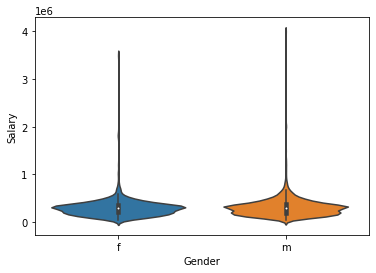

In [98]:
sns.violinplot(x='Gender', y='Salary', data=ameo);

In [101]:
ameo[['Gender', '10percentage', '12percentage', 'collegeGPA', 'Salary']].groupby('Gender').mean()

,10percentage,12percentage,collegeGPA,Salary
Gender,,,,
f,80.932894,77.007618,74.048056,294937.304075
m,76.979000,73.666636,70.679947,311716.211772


In [102]:
ameo[['Gender', '10percentage', '12percentage', 'collegeGPA', 'Salary']].groupby('Gender').median()

,10percentage,12percentage,collegeGPA,Salary
Gender,,,,
f,82.4,77.0,74.00,300000
m,78.0,73.4,70.66,300000


In [103]:
ameo[['conscientiousness', 'agreeableness','extraversion', 'nueroticism','openess_to_experience', 'Gender']].groupby('Gender').mean()

,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
Gender,,,,,
f,0.121034,0.292444,0.012173,-0.179358,0.038246
m,-0.087826,0.100566,-0.000198,-0.165783,-0.193609


In [104]:
ameo[['conscientiousness', 'agreeableness','extraversion', 'nueroticism','openess_to_experience', 'Gender']].groupby('Gender').median()

,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
Gender,,,,,
f,0.2718,0.3789,0.0914,-0.23440,0.0973
m,-0.0154,0.2124,0.0914,-0.17277,-0.0943


In [105]:
ameo[['Salary', 'Gender']].groupby('Gender').mean()

,Salary
Gender,
f,294937.304075
m,311716.211772


In [106]:
ameo[['Salary', 'Gender']].groupby('Gender').median()

,Salary
Gender,
f,300000
m,300000


In [107]:
t = ameo.Salary.mean()+ ameo.Salary.std()

In [115]:
ameo['HighIncome'] = ameo.Salary>t

In [117]:
ameo.sample(10)

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,HighIncome
3330,train,553678,265000,2013-11-01,present,research analyst,Gurgaon,m,1991-10-05,91.00,...,-1,-1,-1,-1,-0.4463,-0.7866,-0.4511,-0.6147,-1.4356,False
3755,train,1242113,240000,2014-11-01,present,field service engineer,New Delhi,m,1992-06-03,66.70,...,-1,-1,-1,-1,0.2718,0.3789,0.4711,-0.2344,0.4805,False
2278,train,287134,400000,2012-05-01,2015-05-01 00:00:00,programmer analyst,-1,m,1988-07-30,62.00,...,-1,-1,-1,-1,-0.2628,-0.5913,-0.1988,0.0623,-0.1295,False
3649,train,518448,280000,2013-03-01,2014-04-01 00:00:00,php developer,Jaipur,m,1990-01-20,54.50,...,-1,-1,-1,-1,-0.4173,-2.6583,-1.6865,-0.2902,-2.3412,False
2028,train,489939,285000,2013-02-01,present,customer service representative,Pune,m,1989-09-17,74.60,...,-1,-1,-1,-1,0.2782,1.7488,0.3817,0.6204,0.9763,False
2599,train,196470,440000,2011-09-01,present,systems engineer,Pune,m,1987-01-20,68.60,...,-1,-1,-1,-1,1.1283,0.0328,-0.1988,-1.2303,0.9763,False
213,train,391074,445000,2013-03-01,2015-04-01 00:00:00,quality analyst,Bangalore,m,1990-05-18,84.96,...,-1,-1,-1,-1,-1.3447,0.3448,-0.6343,1.0024,-0.0506,False
793,train,287020,445000,2011-03-01,present,software developer,-1,m,1985-12-08,63.20,...,-1,-1,-1,-1,0.0464,-0.1232,-0.1988,-1.1128,-0.2875,False
3775,train,1066890,180000,2014-07-01,2015-01-01 00:00:00,associate software engineer,-1,m,1992-08-03,84.00,...,-1,-1,-1,-1,1.2772,1.7109,1.7007,-2.1360,0.4805,False
560,train,536794,450000,2013-08-01,present,software engineer,Pune,f,1992-03-18,88.80,...,-1,-1,-1,-1,-0.1082,0.8128,-0.0537,0.6498,-0.0506,False


In [119]:
ameo[['Salary', 'HighIncome','Gender']].groupby(['HighIncome', 'Gender']).mean()

Salary
HighIncome Gender               
False      f       271499.454744
           m       272598.433606
True       f       832250.000000
           m       785344.827586

In [120]:
ameo[['Salary', 'HighIncome','Gender']].groupby(['HighIncome', 'Gender']).count()

Salary
HighIncome Gender        
False      f          917
           m         2809
True       f           40
           m          232

In [123]:
print("Women low income group", 917/(2809+917)*100)
print("Women high income group", 40/(232+40)*100)

# Mean is low not because women are earning less because women are not rising up very well

Women low income group 24.610842726784757
Women high income group 14.705882352941178


In [125]:
ameo[['CollegeTier', 'HighIncome', 'Salary']].groupby(['HighIncome', 'CollegeTier']).count()

Salary
HighIncome CollegeTier        
False      1               234
           2              3492
True       1                63
           2               209

In [127]:
print("Tier 2 low income group", 3492/(3492+234)*100)
print("Tier 2 high income group", 209/(209+63)*100)

Tier 2 low income group 93.71980676328504
Tier 2 high income group 76.83823529411765


In [129]:
ameo[['Gender','CollegeTier', 'Salary']].groupby(['CollegeTier', 'Gender']).count()


Salary
CollegeTier Gender        
1           f           51
            m          246
2           f          906
            m         2795

In [130]:
print("Tier 1 female group", 51/(51+246)*100)
print("Tier 2 female group", 906/(906+2795)*100)

Tier 1 female group 17.17171717171717
Tier 2 female group 24.479870305322883


# Agriculture

In [18]:
agri = pd.read_csv('apy.csv', na_values='=')

In [5]:
agri.head()

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
0,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Arecanut,1254.0,2000.0
1,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Other Kharif pulses,2.0,1.0
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,102.0,321.0
3,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Banana,176.0,641.0
4,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Cashewnut,720.0,165.0


In [6]:
agri.State_Name.unique()

array(['Andaman and Nicobar Islands', 'Andhra Pradesh',
       'Arunachal Pradesh', 'Assam', 'Bihar', 'Chandigarh',
       'Chhattisgarh', 'Dadra and Nagar Haveli', 'Goa', 'Gujarat',
       'Haryana', 'Himachal Pradesh', 'Jammu and Kashmir ', 'Jharkhand',
       'Karnataka', 'Kerala', 'Madhya Pradesh', 'Maharashtra', 'Manipur',
       'Meghalaya', 'Mizoram', 'Nagaland', 'Odisha', 'Puducherry',
       'Punjab', 'Rajasthan', 'Sikkim', 'Tamil Nadu', 'Telangana ',
       'Tripura', 'Uttar Pradesh', 'Uttarakhand', 'West Bengal'],
      dtype=object)

In [7]:
agri.Crop_Year.unique()

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2010, 1997, 1998, 1999,
       2007, 2008, 2009, 2011, 2012, 2013, 2014, 2015], dtype=int64)

In [8]:
agri.dtypes

State_Name        object
District_Name     object
Crop_Year          int64
Season            object
Crop              object
Area             float64
Production       float64
dtype: object

In [9]:
agri.Season.unique()

array(['Kharif     ', 'Whole Year ', 'Autumn     ', 'Rabi       ',
       'Summer     ', 'Winter     '], dtype=object)

In [10]:
agri.Production.isnull().sum()

3727

In [11]:
agri.shape

(246091, 7)

In [3]:
agri.dropna(inplace=True)

In [15]:
agri.shape

(242364, 7)

In [16]:
agri.Production.unique()

array([2.00000e+03, 1.00000e+00, 3.21000e+02, ..., 7.29553e+05,
       7.30136e+05, 5.97899e+05])

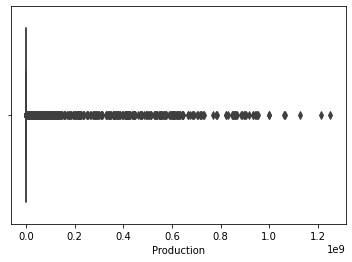

In [17]:
sns.boxplot(agri.Production);

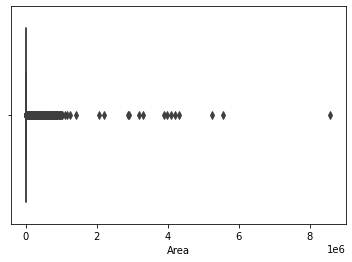

In [154]:
sns.boxplot(agri.Area);

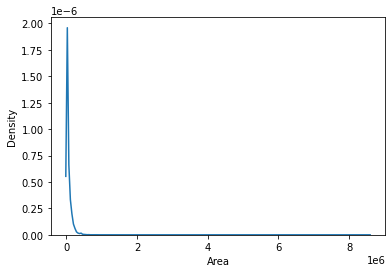

In [155]:
sns.kdeplot(agri.Area);


In [18]:
agri[agri.State_Name == 'Karnataka']['District_Name'].unique()

array(['BAGALKOT', 'BANGALORE RURAL', 'BELGAUM', 'BELLARY',
       'BENGALURU URBAN', 'BIDAR', 'BIJAPUR', 'CHAMARAJANAGAR',
       'CHIKBALLAPUR', 'CHIKMAGALUR', 'CHITRADURGA', 'DAKSHIN KANNAD',
       'DAVANGERE', 'DHARWAD', 'GADAG', 'GULBARGA', 'HASSAN', 'HAVERI',
       'KODAGU', 'KOLAR', 'KOPPAL', 'MANDYA', 'MYSORE', 'RAICHUR',
       'RAMANAGARA', 'SHIMOGA', 'TUMKUR', 'UDUPI', 'UTTAR KANNAD',
       'YADGIR'], dtype=object)

In [19]:
agri.groupby(['State_Name', 'Crop', 'Crop_Year']).sum()

Area  Production
State_Name                  Crop     Crop_Year                       
Andaman and Nicobar Islands Arecanut 2000         4354.00     7200.00
                                     2001         4354.00     7300.00
                                     2002         4363.00     7350.00
                                     2003         4379.00     6707.00
                                     2004         4425.37     4781.05
...                                                   ...         ...
West Bengal                 Wheat    2010       316808.00   874415.00
                                     2011       315659.00   872895.00
                                     2012       321572.00   895927.00
                                     2013       331481.00   927837.00
                                     2014       334640.00   939254.00

[12896 rows x 2 columns]

In [20]:
agri[agri.State_Name == 'Karnataka']['Crop'].unique()

array(['Arhar/Tur', 'Bajra', 'Castor seed', 'Cotton(lint)', 'Groundnut',
       'Horse-gram', 'Jowar', 'Maize', 'Moong(Green Gram)', 'Niger seed',
       'Onion', 'Rapeseed &Mustard', 'Rice', 'Sesamum', 'Soyabean',
       'Sunflower', 'Gram', 'Linseed', 'Safflower', 'Wheat', 'Arecanut',
       'Coconut ', 'Coriander', 'Dry chillies', 'Garlic', 'Turmeric',
       'Mesta', 'Other Kharif pulses', 'Small millets',
       'Other  Rabi pulses', 'Banana', 'Sugarcane', 'Sweet potato',
       'Sannhamp', 'Arcanut (Processed)', 'Atcanut (Raw)', 'Brinjal',
       'Citrus Fruit', 'Grapes', 'Mango', 'Other Fresh Fruits', 'Papaya',
       'Pome Fruit', 'Tomato', 'Urad', 'Cashewnut', 'Tobacco',
       'Cowpea(Lobia)', 'Black pepper', 'Dry ginger', 'Paddy',
       'Peas & beans (Pulses)', 'Potato', 'Ragi', 'Tapioca',
       'Beans & Mutter(Vegetable)', 'Cashewnut Processed',
       'Cashewnut Raw', 'Cardamom'], dtype=object)

In [21]:
agri.groupby(['State_Name','Crop_Year']).sum()

Area   Production
State_Name                  Crop_Year                         
Andaman and Nicobar Islands 2000         44518.00  89060914.00
                            2001         41163.00  89718700.00
                            2002         45231.40  94387137.67
                            2003         44799.40  95296454.67
                            2004         45308.77  87186497.63
...                                           ...          ...
West Bengal                 2010       7246875.00  38308645.00
                            2011       7755360.00  36777774.00
                            2012       7850936.00  38918275.00
                            2013       7999815.00  37901281.00
                            2014       8058390.00  43584403.00

[519 rows x 2 columns]

In [23]:
df = agri.groupby(['State_Name','Crop_Year']).sum()

In [24]:
df.reset_index(inplace=True)

In [25]:
df.head()

,State_Name,Crop_Year,Area,Production
0,Andaman and Nicobar Islands,2000,44518.00,89060914.00
1,Andaman and Nicobar Islands,2001,41163.00,89718700.00
2,Andaman and Nicobar Islands,2002,45231.40,94387137.67
3,Andaman and Nicobar Islands,2003,44799.40,95296454.67
4,Andaman and Nicobar Islands,2004,45308.77,87186497.63


In [26]:
df[['State_Name','Crop_Year']].groupby('State_Name').count()

,Crop_Year
State_Name,
Andaman and Nicobar Islands,8
Andhra Pradesh,18
Arunachal Pradesh,18
Assam,18
Bihar,18
Chandigarh,13
Chhattisgarh,15
Dadra and Nagar Haveli,17
Goa,12


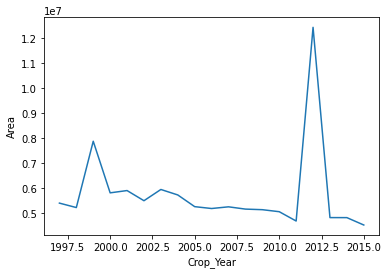

In [27]:
sns.lineplot(x='Crop_Year', y='Area', data=df[df.State_Name=='Odisha']);

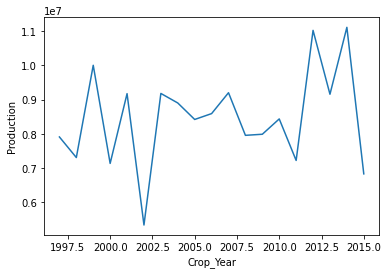

In [28]:
sns.lineplot(x='Crop_Year', y='Production', data=df[df.State_Name=='Odisha']);

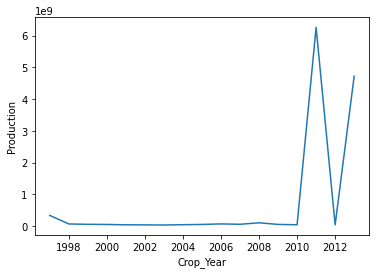

In [29]:
sns.lineplot(x='Crop_Year', y='Production', data=df[df.State_Name=='Tamil Nadu']);

In [37]:
import plotly.express as px

In [38]:
px.scatter(df, x='Area', y='Production', animation_frame='Crop_Year', animation_group='State_Name', color='State_Name')

In [56]:
agri.sort_values('Crop_Year', inplace=True)

In [63]:
agri[(agri.State_Name== 'Andhra Pradesh')]

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
6351,Andhra Pradesh,SPSR NELLORE,1997,Rabi,Urad,5400.0,2600.0
6350,Andhra Pradesh,SPSR NELLORE,1997,Rabi,Sunflower,200.0,100.0
6335,Andhra Pradesh,SPSR NELLORE,1997,Kharif,Ragi,300.0,200.0
6336,Andhra Pradesh,SPSR NELLORE,1997,Kharif,Rice,48700.0,127600.0
6337,Andhra Pradesh,SPSR NELLORE,1997,Kharif,Sesamum,1100.0,200.0
...,...,...,...,...,...,...,...
2509,Andhra Pradesh,EAST GODAVARI,2014,Kharif,Papaya,305.0,24011.0
2508,Andhra Pradesh,EAST GODAVARI,2014,Kharif,other oilseeds,8923.0,185768.0
2507,Andhra Pradesh,EAST GODAVARI,2014,Kharif,Onion,563.0,10337.0
2506,Andhra Pradesh,EAST GODAVARI,2014,Kharif,Moong(Green Gram),483.0,324.0


In [57]:
agri.dropna(inplace=True)

In [58]:
agri[(agri.State_Name=='Kerala') & (agri.Crop_Year==2000)].sort_values('Production')

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
99868,Kerala,KOTTAYAM,2000,Kharif,Sesamum,6.0,1.0
100437,Kerala,MALAPPURAM,2000,Kharif,Ragi,4.0,3.0
99567,Kerala,KOLLAM,2000,Summer,Rice,4.0,4.0
98946,Kerala,KANNUR,2000,Kharif,Sesamum,10.0,6.0
101976,Kerala,WAYANAD,2000,Kharif,Sesamum,24.0,7.0
...,...,...,...,...,...,...,...
101702,Kerala,THRISSUR,2000,Whole Year,Coconut,89472.0,540000000.0
98953,Kerala,KANNUR,2000,Whole Year,Coconut,96975.0,621000000.0
100445,Kerala,MALAPPURAM,2000,Whole Year,Coconut,110378.0,626000000.0
101425,Kerala,THIRUVANANTHAPURAM,2000,Whole Year,Coconut,88663.0,635000000.0


In [59]:
df = agri[agri.Crop.isin(['Rice', 'Wheat', 'Maize', 'Ragi'])].groupby(['State_Name','Crop_Year']).sum() 

In [60]:
df.head(10)

Area  Production
State_Name                  Crop_Year                        
Andaman and Nicobar Islands 2000         10881.00    32184.00
                            2001          9801.00    27333.00
                            2002         10885.00    32111.66
                            2003         10561.37    30850.87
                            2004         10734.92    29192.23
                            2005          8685.47    25883.04
                            2006          7776.17    21535.26
                            2010          8553.54    24283.62
Andhra Pradesh              1997       2699200.00  6654900.00
                            1998       2906200.00  7947700.00

In [61]:
df.reset_index(inplace=True)

In [62]:
fig = px.scatter(df, x='Area', y='Production', animation_frame='Crop_Year', animation_group='State_Name', color='State_Name')
fig.show()